In [207]:
%load_ext autoreload
%autoreload 2

import numpy as np
from sklearn import decomposition, cluster
import xarray as xr
import os
from src.clustering.clustering_utils import *
from src.Enumerations import Season, Experiments

#%run /work/aa0238/a271093/Scripts/MOAAP/src/clustering/clustering_preprocess_data.py

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [208]:
Experiments.ICON_CNRM_SSP.value.year_start

2015

161
161
161
161
161


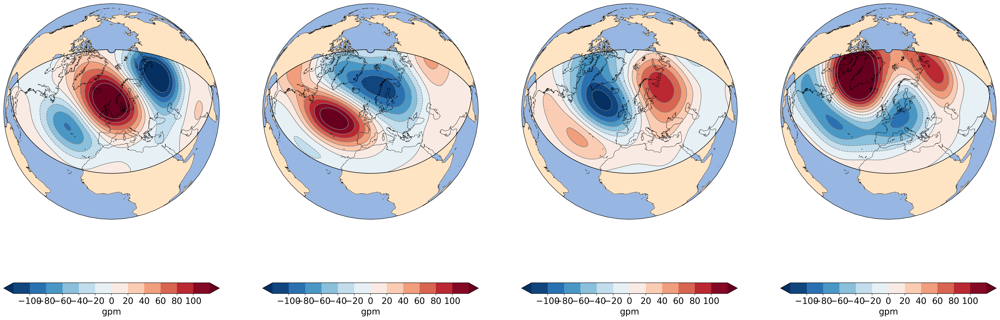

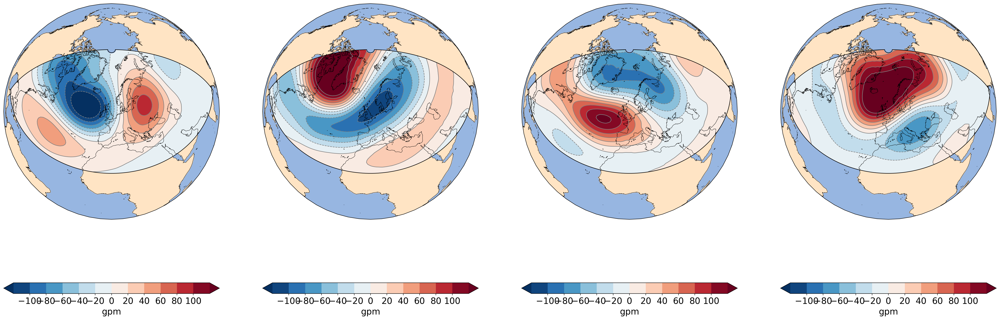

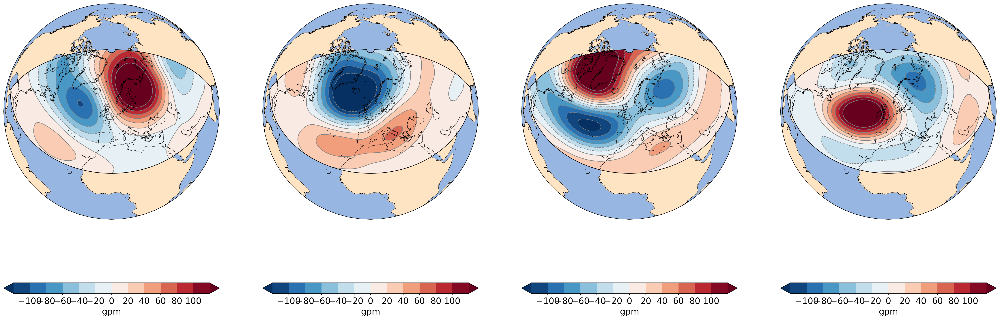

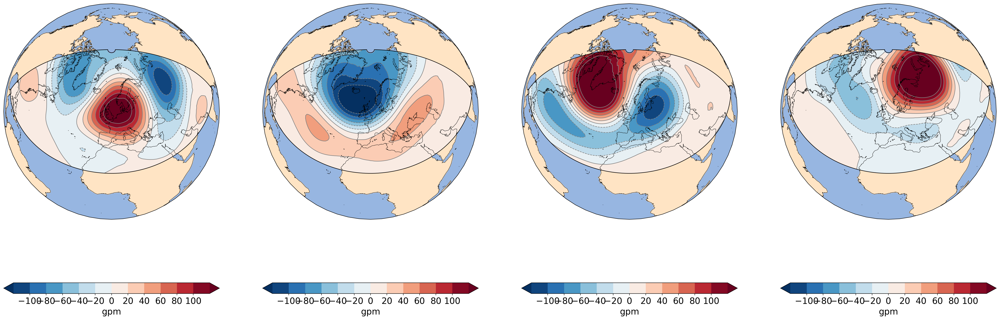

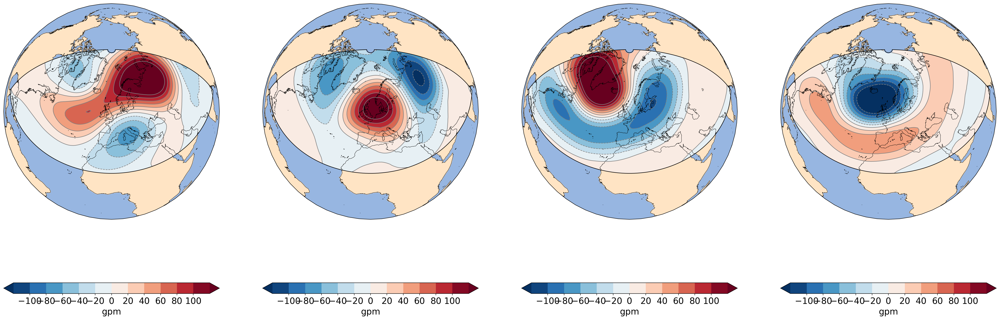

In [215]:
for EXP in Experiments:
#for EXP in [Experiments.ERA5]:

    exp = EXP.value
    season = Season.DJF
    year_start = exp.year_start
    year_end = exp.year_end

    path_in = exp.clustering_data_path
    #file_name = f'NORESM_ICON_control_gph50000_1984_2014_reglonlat_0_360_20_88_1125deg_{season.name}_fldmean_detrend_aac.nc'  # Area selected,  29feb deleted, all months !!!!!!
    file_name = f'{exp.exp_name}_gph70000_{year_start}_{year_end}_reglonlat_-90_90_20_88_1deg_{season.name}_fldmean_detrend_del29feb_aac.nc'


    DO_reduce_dim = 1  #reduce dimensionality before applying clustering
    DO_cosine_cor = 1     #DO cosine correction to data before applying clustering 
                          #and transorm back afterwards


    if DO_reduce_dim:
        n_components = 20  #dimensionality of reduced phase space

    ##################
    #kmeans parameter#
    ##################
    num_cluster = 4
    num_iter = 200     # initiate algorithm n_times randomly and pick best result
    random_state = 42   #reandom seed for reproducibility

    data_xr =xr.load_dataset(path_in+file_name)
    data_aux = np.squeeze(data_xr.zg.values)

    data_ar = np.reshape(data_aux,(data_aux.shape[0], data_aux.shape[1]*data_aux.shape[2])) 

    lat = data_xr.lat.values
    lon = data_xr.lon.values
    time_frame = data_xr.time.values





    if DO_cosine_cor:
        data_ar =  cosine_cor(data_ar,lat,lon)
    data_ar

    if DO_reduce_dim:
        pca = decomposition.PCA(n_components=n_components)
        pca.fit(data_ar)
        data_ar = pca.transform(data_ar)

    #####################
    #######          ####
    ###### KMeans    ####
    #####################


    means = cluster.KMeans(n_clusters=num_cluster,
                    n_init=num_iter,
                    max_iter=900 ,
                    random_state = random_state,
                    algorithm='lloyd').fit(data_ar)
    cluster_centers = means.cluster_centers_
    plot_len = num_cluster
    BMU = means.labels_


    if DO_reduce_dim:
        cluster_centers = pca.inverse_transform(cluster_centers)

    if DO_cosine_cor:
        cluster_centers = inv_cosine_cor(cluster_centers,lat,lon)





    plot_dat = cluster_centers.reshape(-1,lat.size,lon.size)
    cluster_names = np.arange(5)

    fig_cluster = plot_cluster_3D(plot_dat,lat,lon,
                                plot_size=(35, 15),
                                plot_shape=[1,num_cluster],
                                cbar_size=1,
                                cbar_ticks=np.arange(-100,101,20),
                                font_size=17,
                                unit='gpm',
                                color_lev = np.arange(-120,121,20),
                                titles =np.arange(num_cluster))


In [200]:
Experiments.ERA5.value

src.Experiments_infos.ERA5

In [90]:
cluster_dic= {3:"SCAN" , 4 : "NAO+" , 0 : "NAO-", 1 : "ATL-", 2 : "DIP"}
cluster_names = list(cluster_dic.keys())
BMU_bak = np.copy(BMU)
BMU[BMU_bak==cluster_names[0]] = 0
BMU[BMU_bak==cluster_names[1]] = 1
BMU[BMU_bak==cluster_names[2]] =2
BMU[BMU_bak==cluster_names[3]] = 3
BMU[BMU_bak==cluster_names[4]] = 4

In [92]:
BMU

array([4, 4, 4, ..., 4, 4, 4], dtype=int32)

In [115]:
list(cluster_dic.values())

['SCAN', 'NAO+', 'NAO-', 'ATL-', 'DIP']

In [117]:
BMU_df = pd.DataFrame(BMU, index=time_frame)
BMU_df.columns=["cluster_id"]

BMU_df["cluster_name"] = BMU_df.apply(lambda row: list(cluster_dic.values())[row.cluster_id], axis=1)


In [118]:
BMU_df.to_csv()

,cluster_id,cluster_name
1979-01-01,4,DIP
1979-01-02,4,DIP
1979-01-03,4,DIP
1979-01-04,4,DIP
1979-01-05,1,NAO+
...,...,...
2018-12-27,4,DIP
2018-12-28,4,DIP
2018-12-29,4,DIP
2018-12-30,4,DIP


In [102]:
apply(lambda row: row.a + row.b, axis=1)

,cluster_id
1979-01-01,4
1979-01-02,4
1979-01-03,4
1979-01-04,4
1979-01-05,1
...,...
2018-12-27,4
2018-12-28,4
2018-12-29,4
2018-12-30,4
